In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tifffile import imread
import warnings
import plotly.graph_objects as go
import numpy as np
from utils import *
import pandas as pd
# Suppress warnings
warnings.filterwarnings("ignore")

In [2]:
DATA_PATH = '../data/'
print(os.listdir(DATA_PATH))

['visualizations', 'unlabelled.csv', 'volumes', 'foram_metric.py', 'labelled.csv', 'sample_submission.csv', 'forams-classification-2025.zip']


### Investigating General Data Structure

In [3]:
labelled_path = os.path.join(DATA_PATH, 'volumes/volumes/labelled')
print(os.listdir(labelled_path))

unlabelled_path = os.path.join(DATA_PATH, 'volumes/volumes/unlabelled')
print(os.listdir(unlabelled_path))

['labelled_foram_00078_sc_0_367.tif', 'labelled_foram_00059_sc_0_463.tif', 'labelled_foram_00080_sc_0_288.tif', 'labelled_foram_00060_sc_0_901.tif', 'labelled_foram_00111_sc_0_680.tif', 'labelled_foram_00173_sc_0_571.tif', 'labelled_foram_00192_sc_0_533.tif', 'labelled_foram_00076_sc_0_390.tif', 'labelled_foram_00178_sc_0_615.tif', 'labelled_foram_00040_sc_1_84.tif', 'labelled_foram_00054_sc_0_421.tif', 'labelled_foram_00140_sc_0_603.tif', 'labelled_foram_00156_sc_0_646.tif', 'labelled_foram_00130_sc_0_533.tif', 'labelled_foram_00153_sc_0_633.tif', 'labelled_foram_00095_sc_0_344.tif', 'labelled_foram_00068_sc_0_864.tif', 'labelled_foram_00052_sc_0_621.tif', 'labelled_foram_00020_sc_0_500.tif', 'labelled_foram_00055_sc_0_507.tif', 'labelled_foram_00174_sc_0_711.tif', 'labelled_foram_00163_sc_0_666.tif', 'labelled_foram_00152_sc_0_581.tif', 'labelled_foram_00159_sc_0_598.tif', 'labelled_foram_00103_sc_0_340.tif', 'labelled_foram_00166_sc_0_581.tif', 'labelled_foram_00017_sc_0_680.tif', '

In [4]:
# Read the labels
labels_csv_path = os.path.join(DATA_PATH, 'labelled.csv')
no_labels_csv_path = os.path.join(DATA_PATH, 'unlabelled.csv')

# Read the CSV file and save as a dataframe
labels_df = pd.read_csv(labels_csv_path)
print(labels_df.head())
print(labels_df.columns)

no_labels_df = pd.read_csv(no_labels_csv_path)
print(no_labels_df.head())

# Count the number of labels for each class
labels_count = labels_df['label'].value_counts()

               id  label
0  labelled_00000      0
1  labelled_00001      0
2  labelled_00002      0
3  labelled_00003      0
4  labelled_00004      0
Index(['id', 'label'], dtype='object')
   id  label
0   0    NaN
1   1    NaN
2   2    NaN
3   3    NaN
4   4    NaN


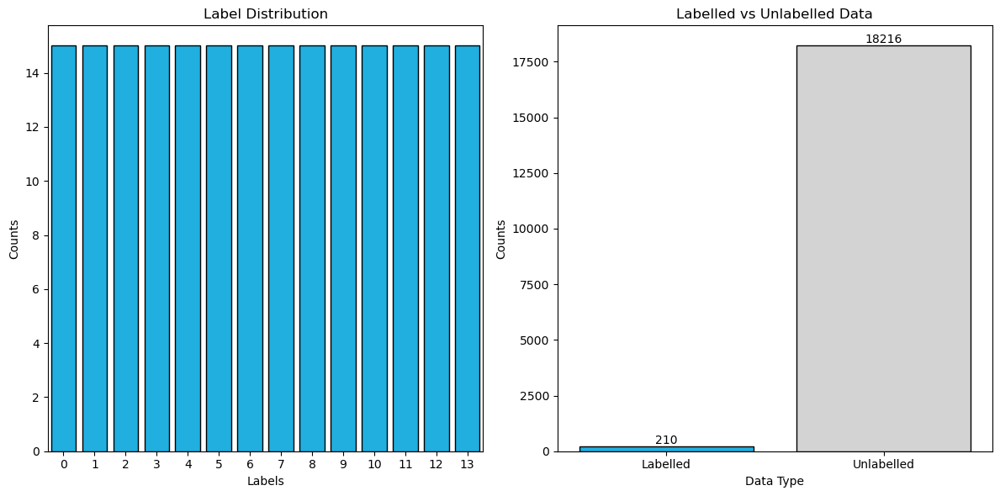

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the distribution of labels
barplot = sns.barplot(
    x=labels_count.index, 
    y=labels_count.values, 
    ax=axes[0], color='deepskyblue'
)
# Add black borders to the bars
for bar in barplot.patches:
    bar.set_edgecolor('black')
    bar.set_linewidth(1)
axes[0].set_title('Label Distribution')
axes[0].set_xlabel('Labels')
axes[0].set_ylabel('Counts')

# Plot the number of labelled and unlabelled data
sns.barplot(
    x=['Labelled', 'Unlabelled'], 
    y=[len(labels_df), len(no_labels_df)], 
    ax=axes[1], palette=['deepskyblue', 'lightgray']
)
# Add black borders to the bars
for bar in axes[1].patches:
    bar.set_edgecolor('black')
    bar.set_linewidth(1)
# Add the count values on top of the bars
for bar in axes[1].patches:
    axes[1].text(
        bar.get_x() + bar.get_width() / 2, 
        bar.get_height() + 5, 
        int(bar.get_height()), 
        ha='center', va='bottom'
    )
# Set the title and labels
axes[1].set_title('Labelled vs Unlabelled Data')
axes[1].set_xlabel('Data Type')
axes[1].set_ylabel('Counts')
plt.tight_layout()
plt.show()

### Looking at the Sample Volumes

In [6]:
print(os.listdir(labelled_path))
sample_volume_path = os.listdir(labelled_path)[0]
print(sample_volume_path)

image = imread(os.path.join(labelled_path, sample_volume_path))
print(image.shape)  

['labelled_foram_00078_sc_0_367.tif', 'labelled_foram_00059_sc_0_463.tif', 'labelled_foram_00080_sc_0_288.tif', 'labelled_foram_00060_sc_0_901.tif', 'labelled_foram_00111_sc_0_680.tif', 'labelled_foram_00173_sc_0_571.tif', 'labelled_foram_00192_sc_0_533.tif', 'labelled_foram_00076_sc_0_390.tif', 'labelled_foram_00178_sc_0_615.tif', 'labelled_foram_00040_sc_1_84.tif', 'labelled_foram_00054_sc_0_421.tif', 'labelled_foram_00140_sc_0_603.tif', 'labelled_foram_00156_sc_0_646.tif', 'labelled_foram_00130_sc_0_533.tif', 'labelled_foram_00153_sc_0_633.tif', 'labelled_foram_00095_sc_0_344.tif', 'labelled_foram_00068_sc_0_864.tif', 'labelled_foram_00052_sc_0_621.tif', 'labelled_foram_00020_sc_0_500.tif', 'labelled_foram_00055_sc_0_507.tif', 'labelled_foram_00174_sc_0_711.tif', 'labelled_foram_00163_sc_0_666.tif', 'labelled_foram_00152_sc_0_581.tif', 'labelled_foram_00159_sc_0_598.tif', 'labelled_foram_00103_sc_0_340.tif', 'labelled_foram_00166_sc_0_581.tif', 'labelled_foram_00017_sc_0_680.tif', '

In [8]:
plot_volume(image, opacity=1, view='orthogonal')

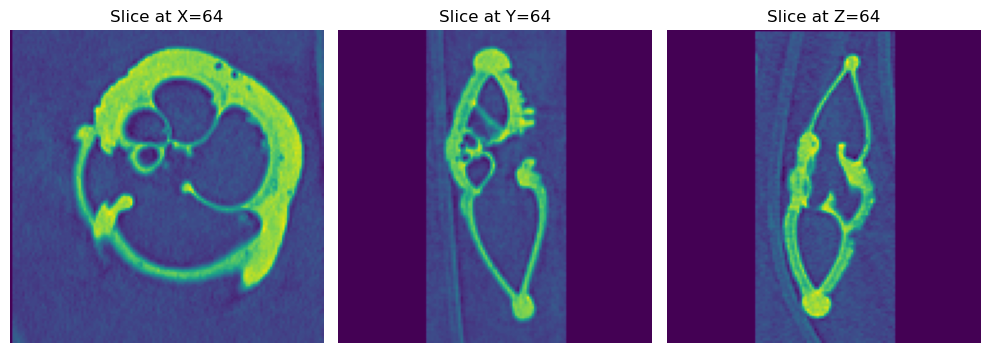

In [9]:
plot_slices(image, cmap='viridis')

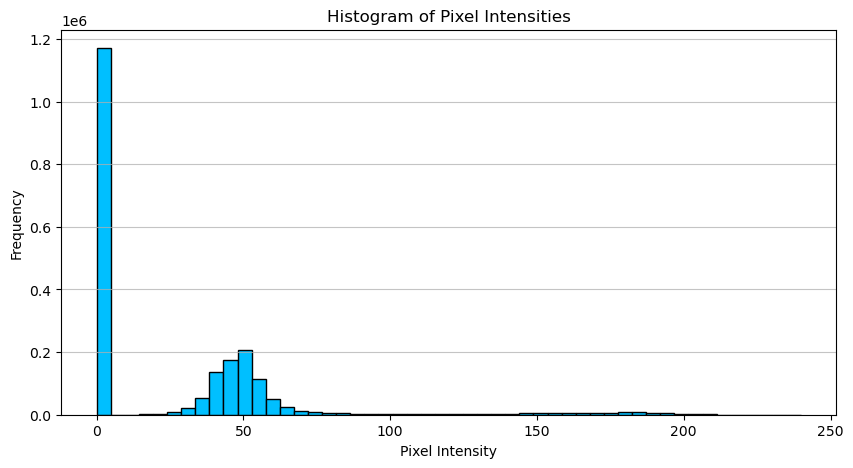

In [10]:
plot_histogram(image)

In [11]:
labels_df.head()

,id,label
0,labelled_00000,0
1,labelled_00001,0
2,labelled_00002,0
3,labelled_00003,0
4,labelled_00004,0


Plotting samples per each class

Class: 0
Random ID: 00009


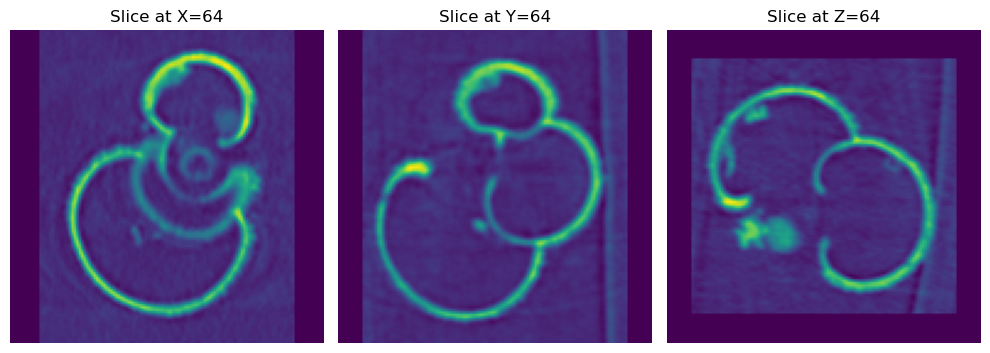

Class: 1
Random ID: 00026


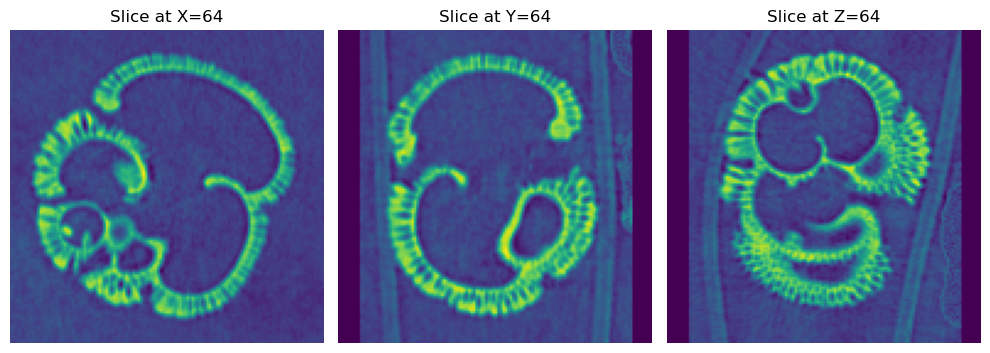

Class: 2
Random ID: 00035


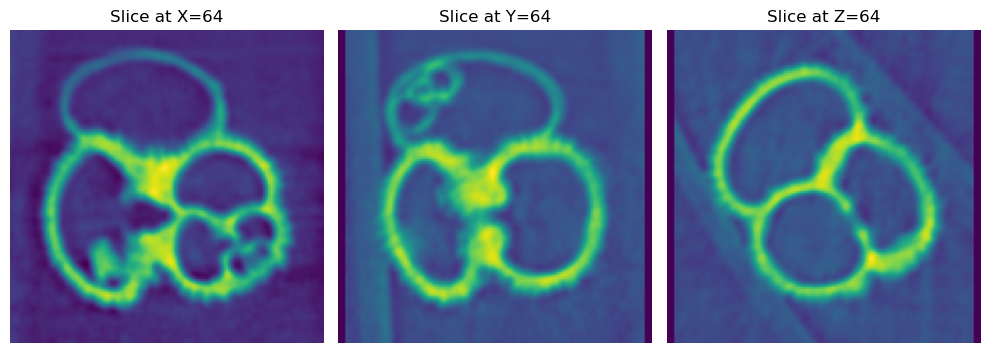

Class: 3
Random ID: 00050


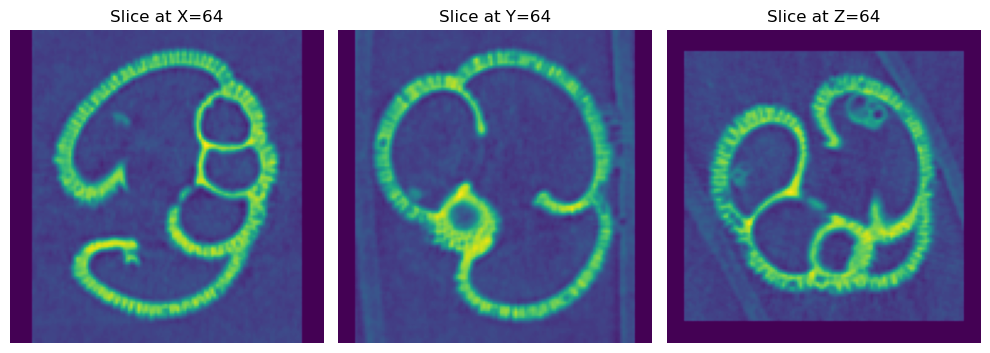

Class: 4
Random ID: 00060


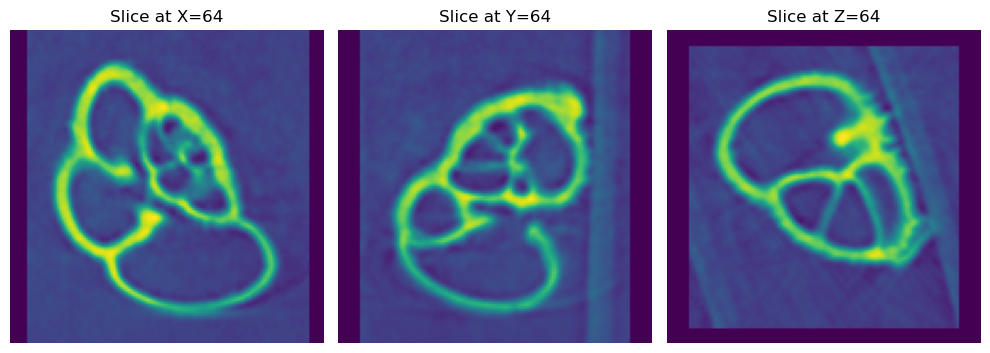

Class: 5
Random ID: 00081


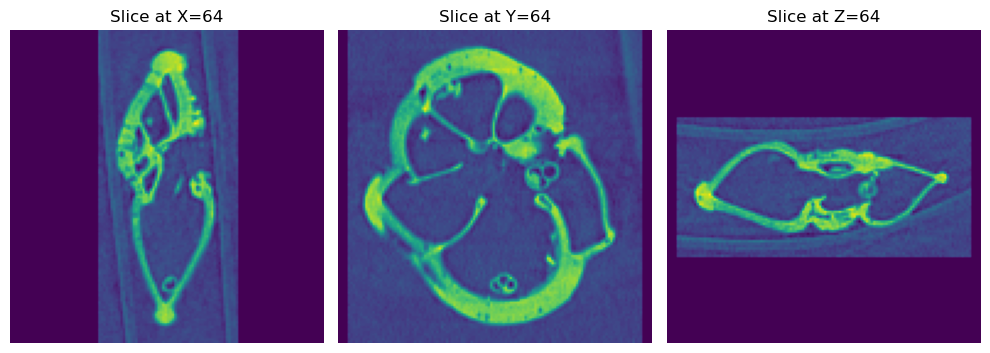

Class: 6
Random ID: 00104


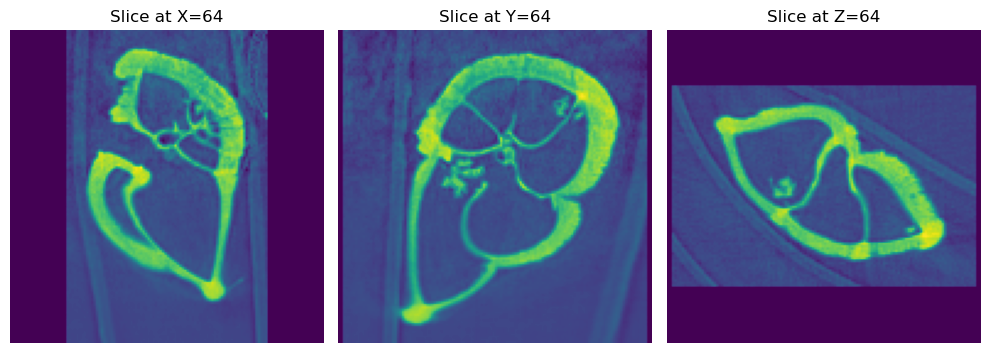

Class: 7
Random ID: 00105


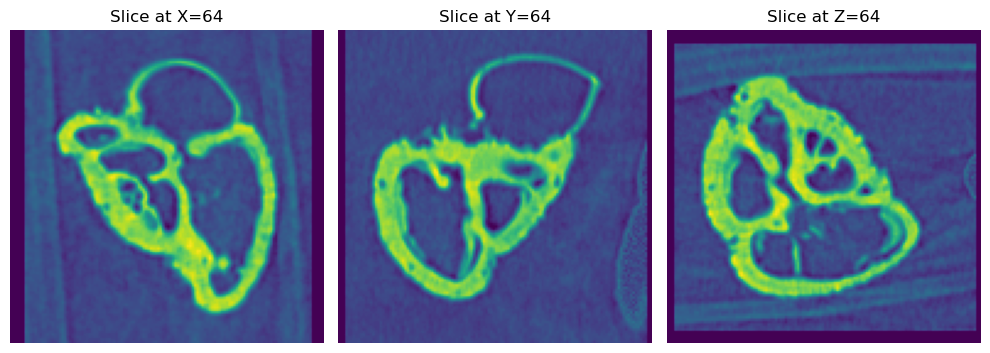

Class: 8
Random ID: 00129


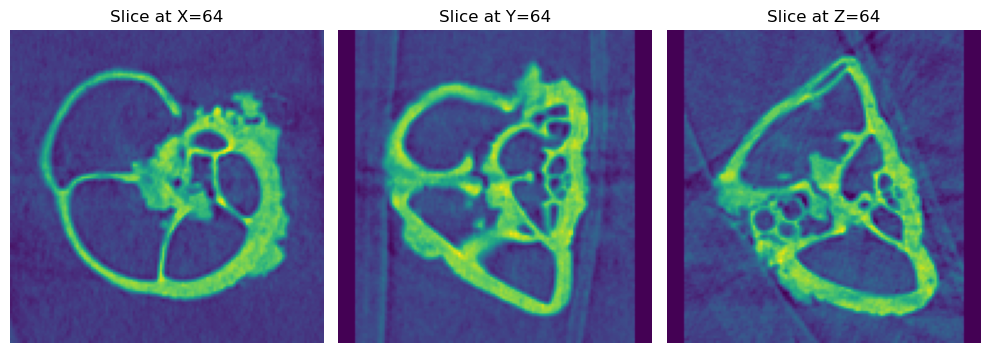

Class: 9
Random ID: 00149


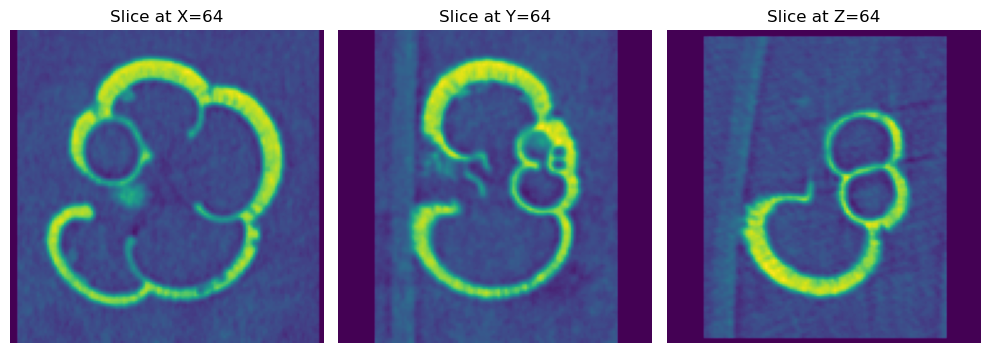

Class: 10
Random ID: 00155


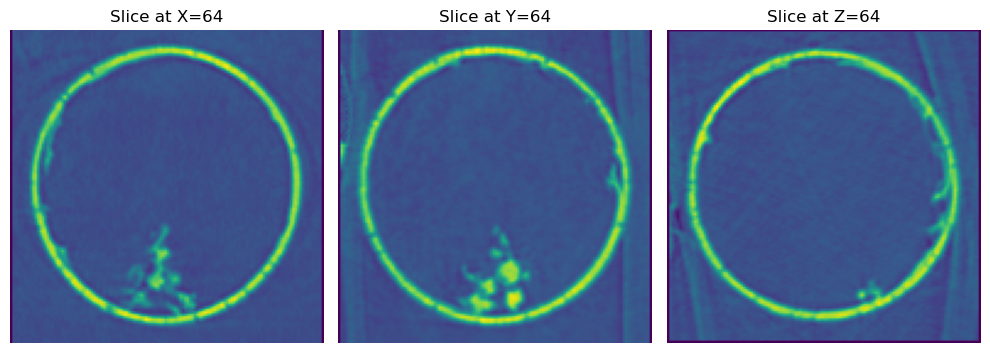

Class: 11
Random ID: 00173


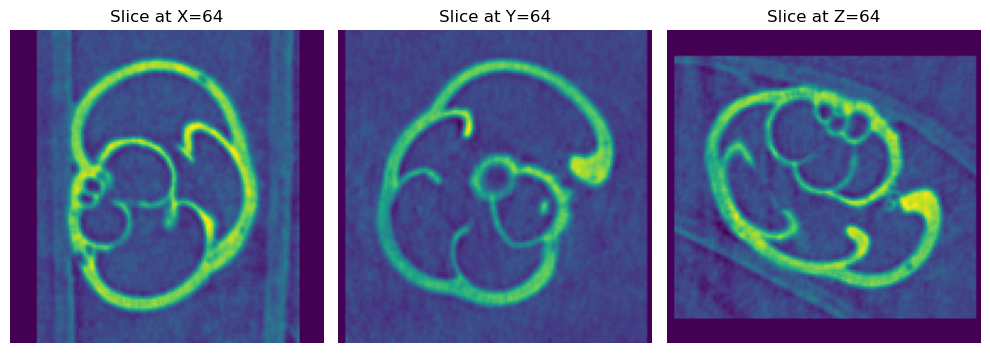

Class: 12
Random ID: 00185


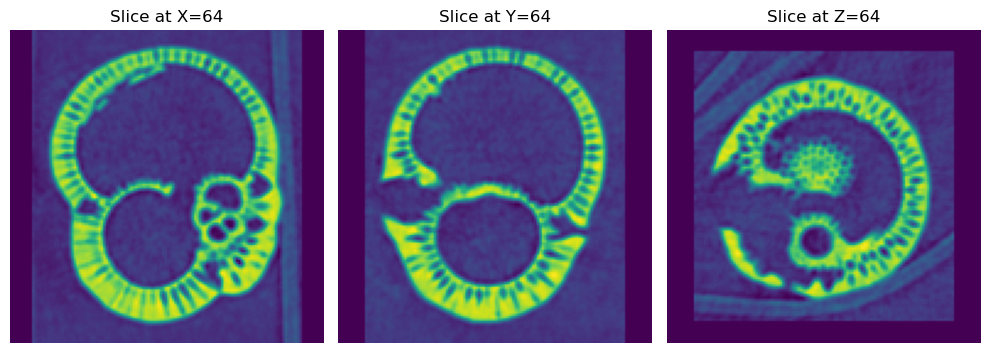

Class: 13
Random ID: 00198


In [ ]:
for class_name in labels_count.index:
    print(f"Class: {class_name}")
    # Get the file names for the current class
    class_files = labels_df[labels_df['label'] == class_name]['id'].values
    # Pick a random file
    random_id = np.random.choice(class_files).split('_')[1]
    print(f"Random ID: {random_id}")
    
    # Find the corresponding file in the labelled directory
    file_name = None
    for file in os.listdir(labelled_path):
        file_id = file.split('_')[2]        
        if file_id == random_id:
            file_name = file
            break
    if file_name is None:
        print(f"No file found for ID {random_id}")
        continue
    
    # Read the image
    image = imread(os.path.join(labelled_path, file_name))
    
    # Plot the image
    plot_slices(image, cmap='viridis')